# GRB image analysis (miniDC2)

This notebook focuses on the image analysis with the latest image deconvolution code (on 2023-07-10). Using the GRB simulation data created for miniDC2, an example of the image analysis will be presented.

Note that this notebook is parcially based on the notebook "GRB-end-to-end.ipynb". If you want to know about the other analysis, e.g., the spectral analysis, you can see https://github.com/israelmcmc/cosipy/blob/master_grb/docs/tutorials/end-to-end/GRB-end-to-end.ipynb. (both this and that notebooks are still tentetive.)

## Data reduction

Before running the cells, please download the files needed for this notebook. You can get them from the COSI google drive. The file list and their location are described in this notebook: https://github.com/israelmcmc/cosipy/tree/master_grb/docs/tutorials/end-to-end/data

Actually, the data reduction is not optimized and takes hours depending on your environments. So I skip this process.
Please download the following data files and then run the following cells. If you want to know the data reduction steps, please read https://github.com/israelmcmc/cosipy/blob/master_grb/docs/tutorials/end-to-end/GRB-end-to-end.ipynb from the top.

- FlatContinuumIsotropic.LowRes.binnedimaging.imagingresponse.area.nside8.cosipy.h5
- 20280301_first_2hrs.ori
- grb_dataIO_config.yml
- bkg_binned_data.hdf5
- grb_bkg_binned_data.hdf5
- imagedeconvolution_parfile_itr10_20230710.yml (this file is not on the Google drive. It is at cosipy/test_data)

# read response

In [1]:
from cosipy.response import FullDetectorResponse

response_path = "data/FlatContinuumIsotropic.LowRes.binnedimaging.imagingresponse.area.nside8.cosipy.h5"

response = FullDetectorResponse.open(response_path)

print(response.axes['Em'].edges)
print(response.axes['Phi'].edges)
print(response.axes['PsiChi'].nside)
print(response.axes['PsiChi'].scheme)

Welcome to JupyROOT 6.24/06


16:32:38 WARNING   The naima package is not available. Models that depend on it will not be         ]8;id=333473;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/functions/functions_1D/functions.py\functions.py]8;;\:]8;id=986973;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/functions/functions_1D/functions.py#48\48]8;;\
                  available                                                                                        

         WARNING   The GSL library or the pygsl wrapper cannot be loaded. Models that depend on it  ]8;id=899262;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/functions/functions_1D/functions.py\functions.py]8;;\:]8;id=774901;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/functions/functions_1D/functions.py#69\69]8;;\
                  will not be available.                                                                           

         WARNING   The ebltable package is not available. Models that depend on it will not be     ]8;id=441871;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/functions/functions_1D/absorption.py\absorption.py]8;;\:]8;id=135984;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/functions/functions_1D/absorption.py#36\36]8;;\
                  available                                                                                        

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=102649;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=556311;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=471268;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=606084;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=745487;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=803779;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=733401;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=865100;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of F to 1e-99 because there was a postive transform   ]8;id=480926;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=466008;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py#704\704]8;;\

         WARNING   We have set the min_value of K to 1e-99 because there was a postive transform   ]8;id=26832;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py\parameter.py]8;;\:]8;id=450334;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/astromodels/core/parameter.py#704\704]8;;\

16:32:38 INFO      Starting 3ML!                                                                     ]8;id=339529;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=64388;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#35\35]8;;\

         WARNING   WARNINGs here are NOT errors                                                      ]8;id=159699;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=210733;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#36\36]8;;\

         WARNING   but are inform you about optional packages that can be installed                  ]8;id=972677;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=347463;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#37\37]8;;\

         WARNING    to disable these messages, turn off start_warning in your config file            ]8;id=425168;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=410925;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#40\40]8;;\

16:32:39 WARNING   Multinest minimizer not available                                           ]8;id=52899;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/minimizer/minimization.py\minimization.py]8;;\:]8;id=276813;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/minimizer/minimization.py#1357\1357]8;;\

         WARNING   PyGMO is not available                                                      ]8;id=398935;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/minimizer/minimization.py\minimization.py]8;;\:]8;id=868760;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/minimizer/minimization.py#1369\1369]8;;\

16:32:39 WARNING   The cthreeML package is not installed. You will not be able to use plugins which  ]8;id=68282;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=951086;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#94\94]8;;\
                  require the C/C++ interface (currently HAWC)                                                     

         WARNING   Could not import plugin HAWCLike.py. Do you have the relative instrument         ]8;id=250897;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=825965;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#144\144]8;;\
                  software installed and configured?                                                               

         WARNING   Could not import plugin FermiLATLike.py. Do you have the relative instrument     ]8;id=150338;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=528796;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#144\144]8;;\
                  software installed and configured?                                                               

         WARNING   No fermitools installed                                              ]8;id=407858;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/utils/data_builders/fermi/lat_transient_builder.py\lat_transient_builder.py]8;;\:]8;id=800918;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/utils/data_builders/fermi/lat_transient_builder.py#44\44]8;;\

         WARNING   Env. variable OMP_NUM_THREADS is not set. Please set it to 1 for optimal         ]8;id=456133;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=676276;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#387\387]8;;\
                  performances in 3ML                                                                              

         WARNING   Env. variable MKL_NUM_THREADS is not set. Please set it to 1 for optimal         ]8;id=430186;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=272250;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#387\387]8;;\
                  performances in 3ML                                                                              

         WARNING   Env. variable NUMEXPR_NUM_THREADS is not set. Please set it to 1 for optimal     ]8;id=794380;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py\__init__.py]8;;\:]8;id=521860;file:///Users/yoneda/Work/Exp/COSI/cosipy-2/cosipy-2-venv/lib/python3.10/site-packages/threeML/__init__.py#387\387]8;;\
                  performances in 3ML                                                                              

[ 100.  200.  500. 1000. 2000. 5000.] keV
[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160. 170. 180.] deg
8
RING


# read binned GRB files (source and background)

In [2]:
%%time

from cosipy import BinnedData

bkg_data = BinnedData("data/grb_dataIO_config.yml")
bkg_data.load_binned_data_from_hdf5('data/bkg_binned_data.hdf5')

grb_data = BinnedData("data/grb_dataIO_config.yml")
grb_data.load_binned_data_from_hdf5('data/grb_bkg_binned_data.hdf5')

CPU times: user 8.89 s, sys: 977 ms, total: 9.87 s
Wall time: 9.86 s


In [3]:
grb_data.binned_data.axes.labels

array(['Time', 'Em', 'Phi', 'PsiChi'], dtype='<U6')

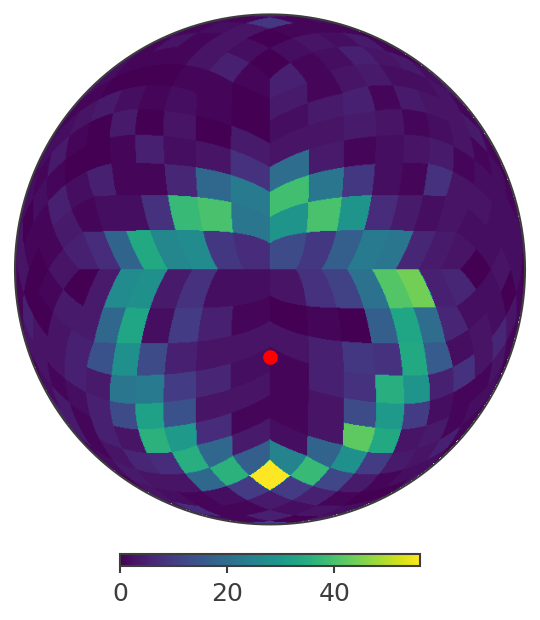

In [4]:
from mhealpy import HealpixMap, HealpixBase

h = grb_data.binned_data.project('Em', 'Phi', 'PsiChi').slice[{'Em':2, 'Phi':3}].project('PsiChi')
m = HealpixMap(base = HealpixBase(npix = h.nbins), data = h.contents.todense())

_,ax = m.plot('orthview', ax_kw = {'rot':[0,90,0]})
#_,ax = m.plot('mollview')

ax.scatter(0, 70, transform=ax.get_transform('world'), color = 'red')

In [5]:
spec_grb = grb_data.binned_data.project('Em')
spec_bkg = bkg_data.binned_data.project('Em') * (1/3600)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


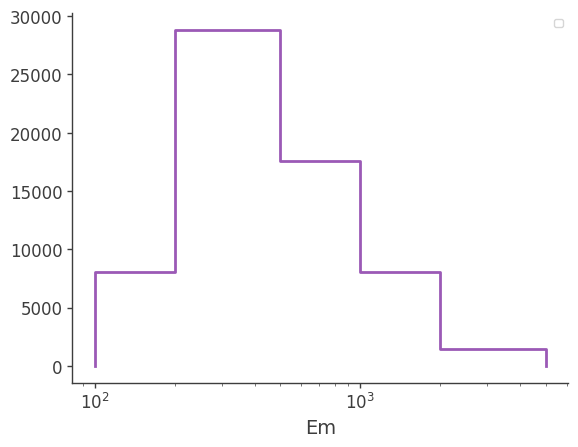

In [6]:
import matplotlib.pyplot as plt

fig,ax = plt.subplots()

# spec_grb.plot(ax, label = 'grb')
# spec_bkg.plot(ax, label = 'bkg')

(spec_grb-spec_bkg).plot(ax)

ax.set_xscale('log')

ax.legend()

(<AxesSubplot: xlabel='Time'>, <ErrorbarContainer object of 3 artists>)

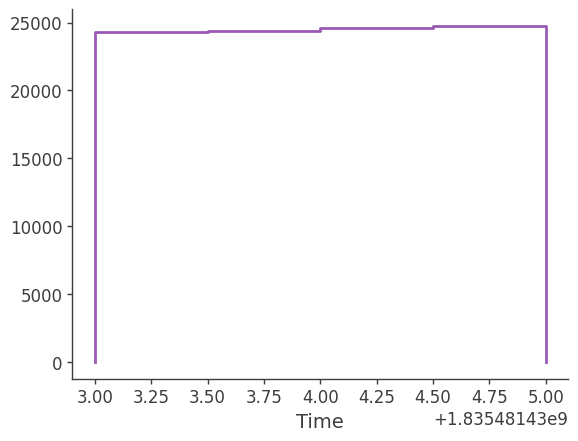

In [7]:
grb_data.binned_data.project('Time').plot()

## SC orientation

Only the first two cells are required for the image analysis

In [8]:
# We'll use histpy's Histogram and mhealpy's HealpixMap as the basis
# develop cosipy. These object (or a derivative) will be passed around by 
# the different modules.
from histpy import Histogram
from mhealpy import HealpixMap

from cosipy.response import FullDetectorResponse
from cosipy.coordinates.orientation import Orientation_file
from cosipy.spacecraftpositionattitude import SpacecraftPositionAttitude
from cosipy.ts_map.TSMap import TSMap

# cosipy uses astropy units
import astropy.units as u
from astropy.units import Quantity
from astropy.coordinates import SkyCoord
from astropy.time import Time
from scoords import Attitude, SpacecraftFrame

#3ML is needed for spectral modeling
from threeML import *
from astromodels import Band


#Other standard libraries
import numpy as np
import matplotlib.pyplot as plt

In [9]:
ori = Orientation_file.parse_from_file("data/20280301_first_2hrs.ori")

#Set the GRB duration
Timemin = Time(1835481433.0,format = 'unix')
Timemax = Time(1835481435.0,format = 'unix')
grbori = ori.source_interval(Timemin, Timemax)

In [10]:
# Simulating a 2 second GRB at l = 51, b = -17 in Galacti coordinates.
coord = SkyCoord(l = 51*u.deg, b = -17*u.deg,
                 frame = 'galactic', attitude = Attitude.identity(frame = 'galactic')) 

In [11]:
# Initiate a SpacecraftPositionAttitude object with the coordinates of the source
SCPosition = SpacecraftPositionAttitude.SourceSpacecraft("GRB", coord) 

# From the orientation, get the attitude and define the source movement in the spacecraft FOV
x,y,z = grbori.get_attitude().as_axes()
dts = grbori.get_time_delta()

src_movement = SCPosition.sc_frame(x_pointings = x[:], y_pointings = y[:], z_pointings = z[:])


Now converting to the Spacecraft frame...
Conversion completed!


In [12]:
dwell_time_map = SCPosition.get_dwell_map(response = response_path, dts = dts, src_path = src_movement[:-1])

Failed to transform from 'spacecraftframe' to 'icrs'. Rasterizing in 'spacecraftframe' frame. ERROR: Spacecraft coordinates need attitude to transform from ICRS


(<matplotlib.image.AxesImage at 0x2ccca82e0>, <Mollview: >)

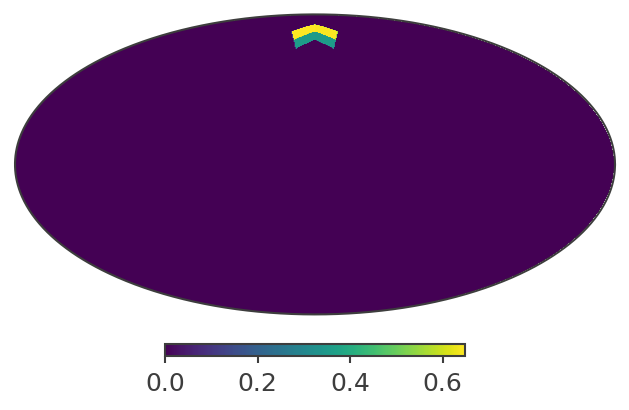

In [13]:
dwell_time_map.plot()

## Imaging

In [14]:
import astropy.units as u
from astropy.time import Time

import matplotlib.pyplot as plt
import numpy as np

from mhealpy import HealpixMap
from scoords import SpacecraftFrame, Attitude
from cosipy.image_deconvolution import DataLoader
from cosipy.image_deconvolution import ImageDeconvolution

In [15]:
from histpy import Axis

dataloader = DataLoader.load(Histogram.concatenate(Axis([1835481433.0,1835481435.0], label = 'Time'), [grb_data.binned_data.project('Em', 'Phi', 'PsiChi')]), 
                             Histogram.concatenate(Axis([1835481433.0,1835481435.0], label = 'Time'), [bkg_data.binned_data.project('Em', 'Phi', 'PsiChi')/3600]), 
                             response, 
                             grbori)

DataLoader is a data container for the image deconvolution. It also calculates several matrix for the analysis.

<span style="color:red">Here the time axis in the data and background files are modified. This is because the current code requires the same time intervals in both files.</span>


<span style="color:red">The background files is renormalized because the background is 2-hour data while the source data is 2-s duration.</span>


<span style="color:red">Such file modification may be confusing, so it will be modified in the future.</span>

## calculate the dwell time map on each pixel

In [16]:
%%time

dataloader.load_full_detector_response_on_memory()

  0%|          | 0/768 [00:00<?, ?it/s]

CPU times: user 16.3 s, sys: 22.2 s, total: 38.5 s
Wall time: 38.4 s


The response file will be loaded on the CPU memory. It requires a few GB. In the actuall analysis, the response will be much larger, ~TB. 

So loading it on the memory might be unrealistic. The optimized (lazy) loading would be a next work.

In [17]:
%%time

dataloader.calc_coordsys_conv_matrix()

... (DataLoader) calculating a coordinate conversion matrix...


  0%|          | 0/768 [00:00<?, ?it/s]

Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame..

Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame..

Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame..

Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame..

Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame..

Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame...
Conversion completed!
Now converting to the Spacecraft frame..

In [18]:
dataloader.save_coordsys_conv_matrix("coordsys_conv_matrix.hdf5")

In [19]:
%%time

dataloader.load_coordsys_conv_matrix_from_filepath("coordsys_conv_matrix.hdf5")

... (DataLoader) loading a coordinate conversion matrix...
... (DataLoader) calculating a projected image response ...
CPU times: user 158 ms, sys: 231 ms, total: 389 ms
Wall time: 389 ms


If you save the coordsys conversion matrix, which is the accumulation of the dwell time map, you can load it and do not have to calculate it again, saving your time.

## set dataloader 

In [20]:
%%time

image_deconvolution = ImageDeconvolution()

image_deconvolution.set_data(dataloader)

data for image deconvolution was set ->  <cosipy.image_deconvolution.data_loader.DataLoader object at 0x2ccd0bb50>
CPU times: user 37 µs, sys: 3 µs, total: 40 µs
Wall time: 42 µs


## read parameter file

In [21]:
# users should edit this cell according to your  path of the yaml file

parameter_filepath = "data/imagedeconvolution_parfile_itr10_20230710.yml"

image_deconvolution.read_parameterfile(parameter_filepath)

parameter file for image deconvolution was set ->  data/imagedeconvolution_parfile_itr10_20230710.yml


In [22]:
image_deconvolution.initialize()

#### Initialization ####
1. generating a model map
---- parameters ----
coordinate: galactic
energy_edges:
- 100.0
- 200.0
- 500.0
- 1000.0
- 2000.0
- 5000.0
nside: 8
scheme: ring

2. initializing the model map ...
---- parameters ----
algorithm: flat
parameter_flat:
  values:
  - 0.01
  - 0.01
  - 0.01
  - 0.01
  - 0.01

3. resistering the deconvolution algorithm ...
... calculating the expected events with the initial model map ...
calc_expectation, memory-save version
---- parameters ----
algorithm: RL_memsave
parameter_RL_memsave:
  acceleration: true
  alpha_max: 10.0
  iteration: 10
  save_results_each_iteration: true

#### Done ####



In [23]:
image_deconvolution.override_parameter("deconvolution:parameter_RL_memsave:iteration = 30")
image_deconvolution.override_parameter("deconvolution:parameter_RL_memsave:alpha_max = 5")

In [24]:
image_deconvolution.initialize()

#### Initialization ####
1. generating a model map
---- parameters ----
coordinate: galactic
energy_edges:
- 100.0
- 200.0
- 500.0
- 1000.0
- 2000.0
- 5000.0
nside: 8
scheme: ring

2. initializing the model map ...
---- parameters ----
algorithm: flat
parameter_flat:
  values:
  - 0.01
  - 0.01
  - 0.01
  - 0.01
  - 0.01

3. resistering the deconvolution algorithm ...
... calculating the expected events with the initial model map ...
calc_expectation, memory-save version
---- parameters ----
algorithm: RL_memsave
parameter_RL_memsave:
  acceleration: true
  alpha_max: 5
  iteration: 30
  save_results_each_iteration: true

#### Done ####



## run the image deconvolution

In [25]:
%%time

all_result = image_deconvolution.run_deconvolution()

#### Deconvolution Starts ####


  0%|          | 0/30 [00:00<?, ?it/s]

  Iteration 1/30 
--> pre-processing
--> E-step
... skip E-step ...
--> M-step



WARNING RuntimeWarning: invalid value encountered in divide



--> post-processing
... calculating the expected events with the updated model map ...
calc_expectation, memory-save version
--> checking stopping criteria
--> --> continue
--> registering results
--> saving results
  Iteration 2/30 
--> pre-processing
--> E-step
... skip E-step ...
--> M-step
--> post-processing
... calculating the expected events with the updated model map ...
calc_expectation, memory-save version
--> checking stopping criteria
--> --> continue
--> registering results
--> saving results
  Iteration 3/30 
--> pre-processing
--> E-step
... skip E-step ...
--> M-step
--> post-processing
... calculating the expected events with the updated model map ...
calc_expectation, memory-save version
--> checking stopping criteria
--> --> continue
--> registering results
--> saving results
  Iteration 4/30 
--> pre-processing
--> E-step
... skip E-step ...
--> M-step
--> post-processing
... calculating the expected events with the updated model map ...
calc_expectation, memory-sav

--> post-processing
... calculating the expected events with the updated model map ...
calc_expectation, memory-save version
--> checking stopping criteria
--> --> continue
--> registering results
--> saving results
  Iteration 30/30 
--> pre-processing
--> E-step
... skip E-step ...
--> M-step
--> post-processing
... calculating the expected events with the updated model map ...
calc_expectation, memory-save version
--> checking stopping criteria
--> --> stop
--> registering results
--> saving results
#### Done ####

CPU times: user 1min, sys: 1min 47s, total: 2min 47s
Wall time: 30.9 s


## image

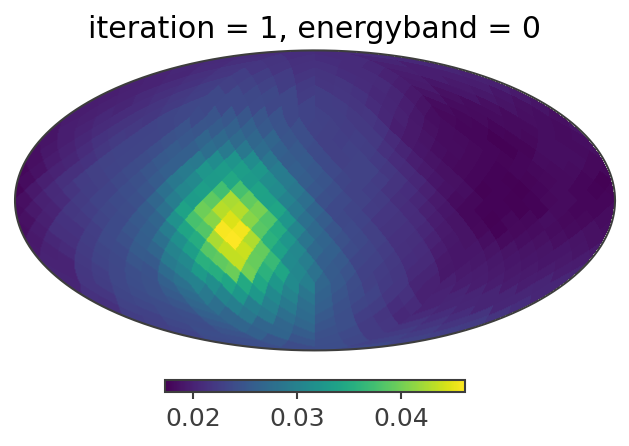

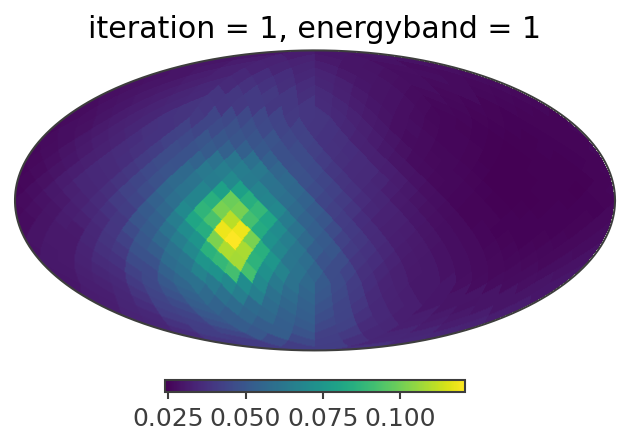

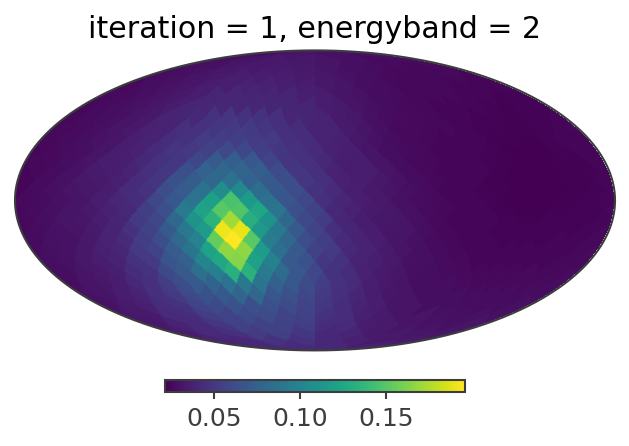

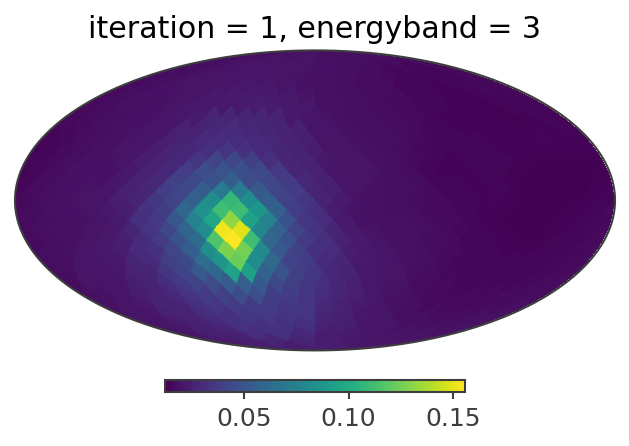

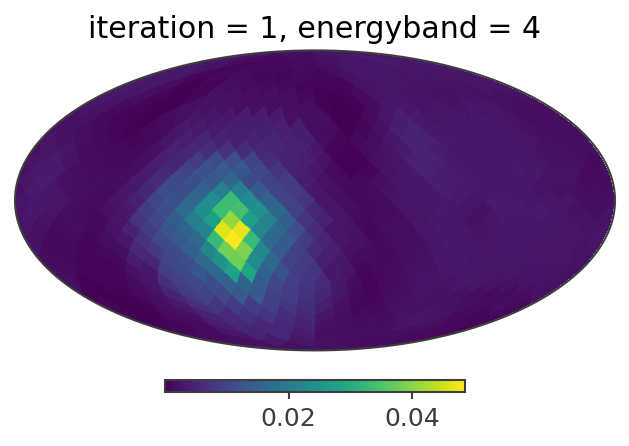

...

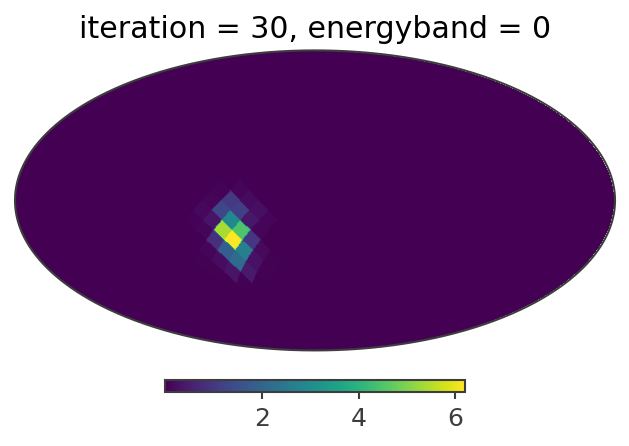

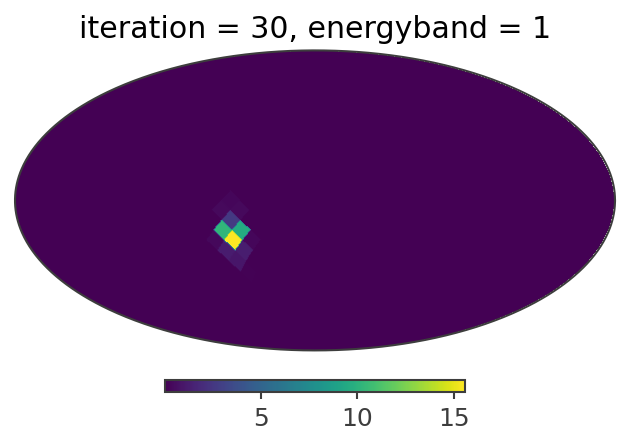

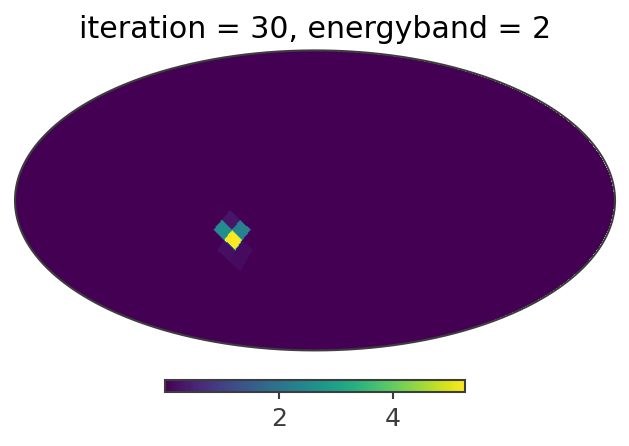

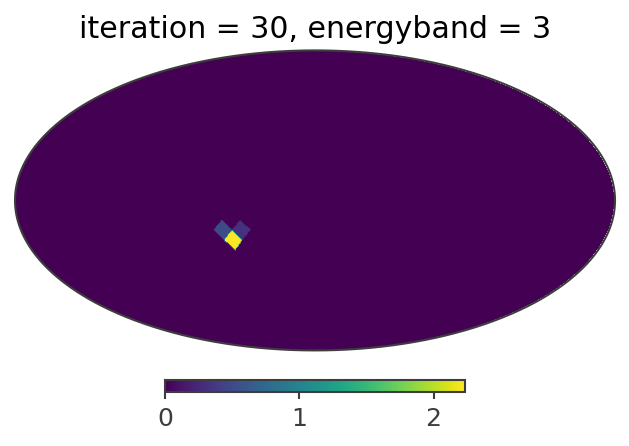

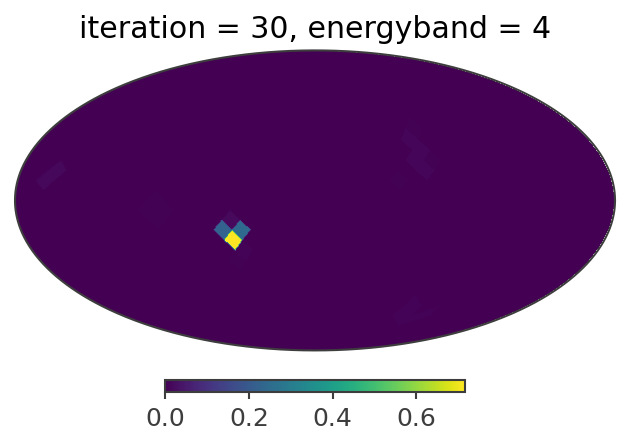

In [26]:
for _ in all_result:
    iteration = _['iteration']
    image = _['model_map']
        
    for energy_band in range(5):
        map_healpxmap = HealpixMap(data = image[:,energy_band], unit = image.unit)

        map_healpxmap.plot()
        plt.title(label = "iteration = {}, energyband = {}".format(iteration, energy_band))
        plt.show()

## delta image

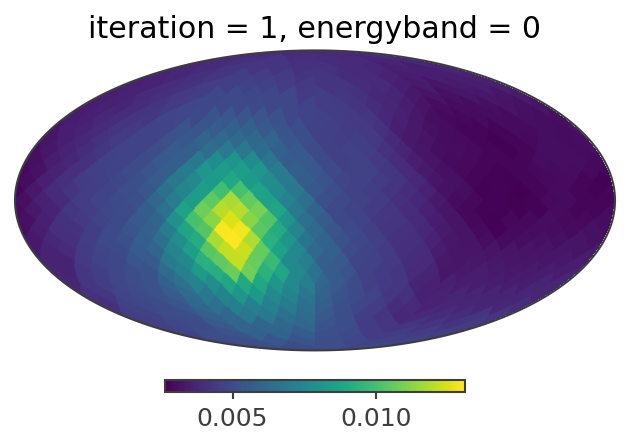

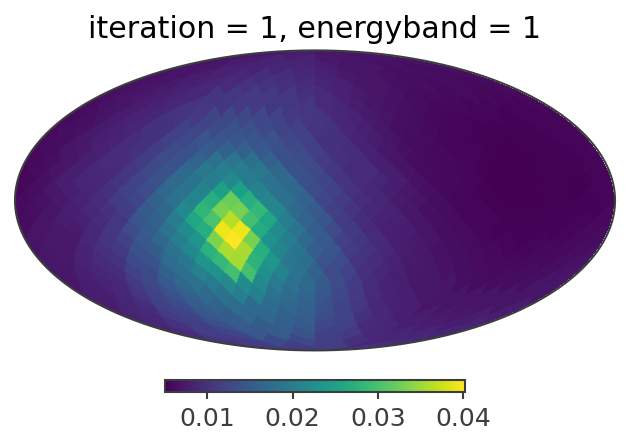

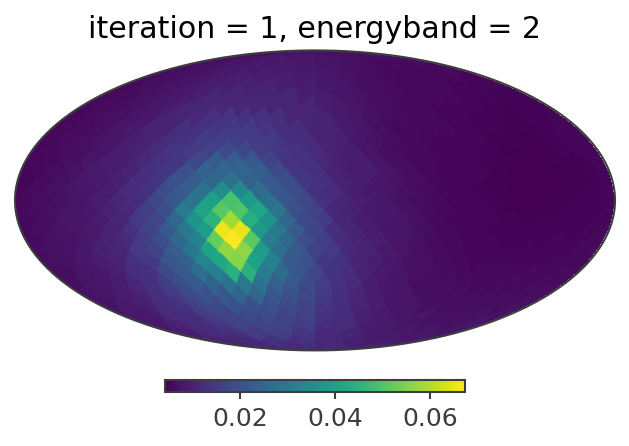

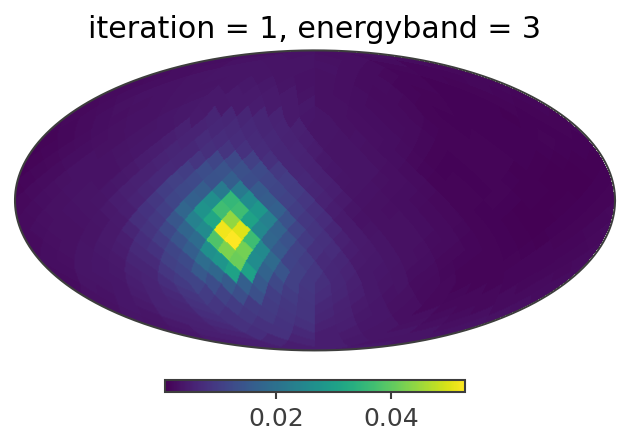

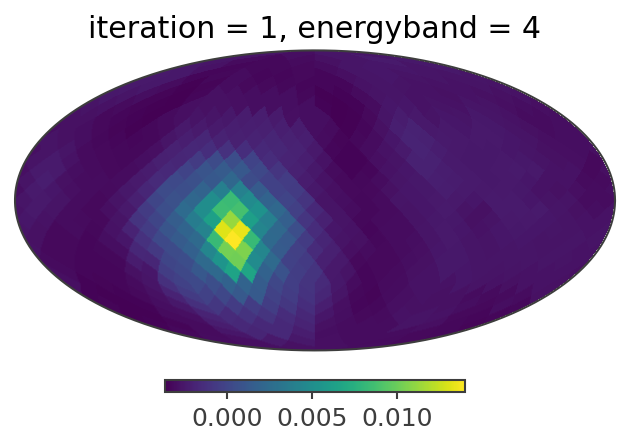

...

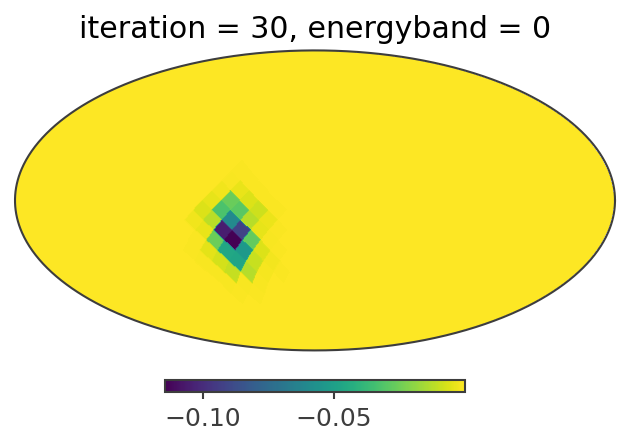

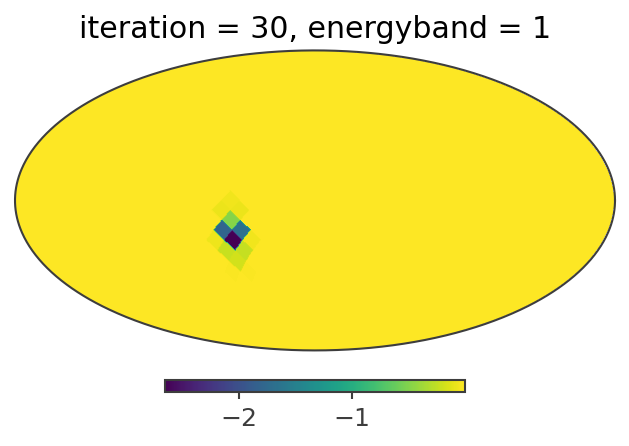

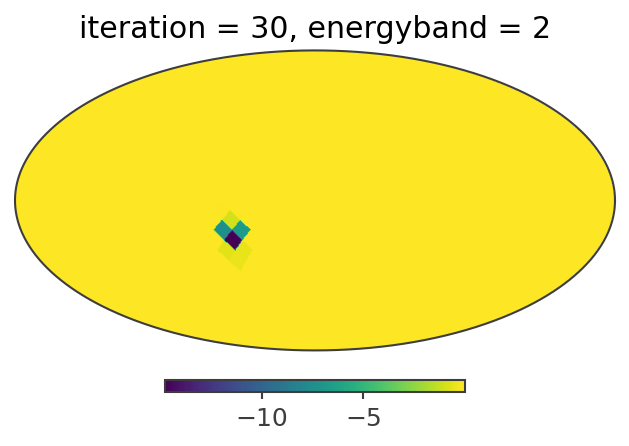

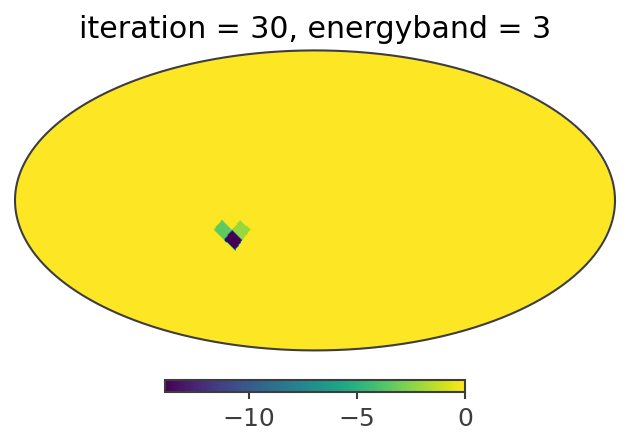

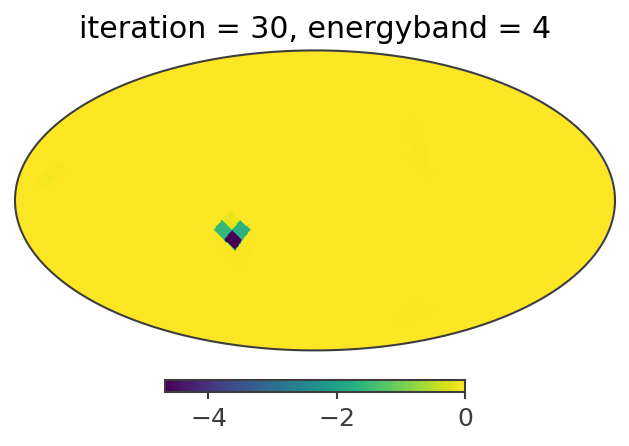

In [27]:
for _ in all_result:
    iteration = _['iteration']
    image = _['delta_map']
        
    for energy_band in range(5):
        map_healpxmap = HealpixMap(data = image[:,energy_band], unit = image.unit)

        map_healpxmap.plot()
        plt.title(label = "iteration = {}, energyband = {}".format(iteration, energy_band))
        plt.show()

## integrated flux

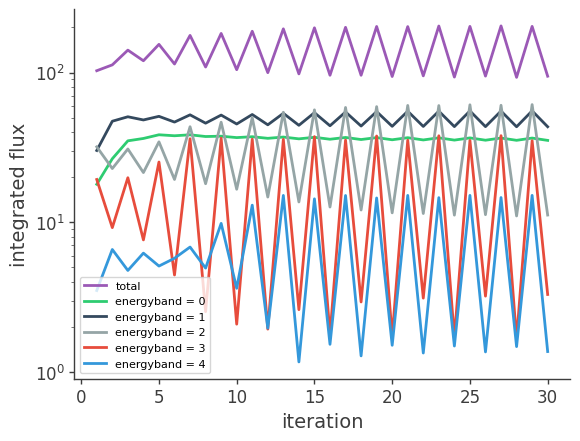

In [28]:
iteration = []
integrated_flux = []
integrated_flux_each_band = [[],[],[],[],[]]

for _ in all_result:
    iteration.append(_['iteration'])
    image = _['model_map']

    integrated_flux.append( np.sum(image) / image.unit)

    for energy_band in range(5):
        integrated_flux_each_band[energy_band].append( np.sum(image[:,energy_band]) / image.unit)
        
plt.plot(iteration, integrated_flux, label = 'total')
plt.xlabel("iteration")
plt.ylabel("integrated flux")
plt.yscale("log")

for energy_band in range(5):
    plt.plot(iteration, integrated_flux_each_band[energy_band], label = "energyband = {}".format(energy_band))
    
plt.legend()

## likelihood

Text(0, 0.5, 'loglikelihood')

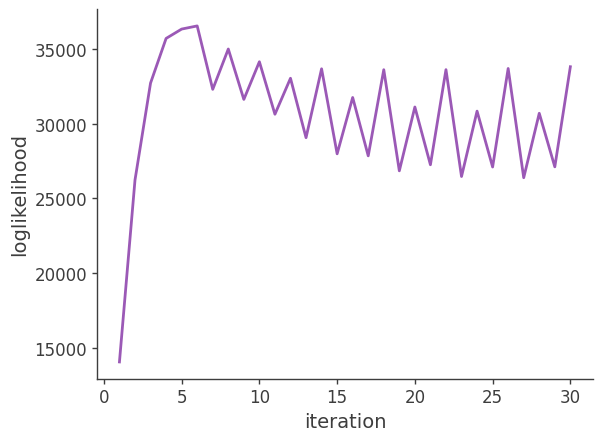

In [29]:
x, y = [], []

for _ in all_result:
    x.append(_['iteration'])
    y.append(_['loglikelihood'])
    
plt.plot(x, y)
plt.xlabel("iteration")
plt.ylabel("loglikelihood")

## alpha

Text(0, 0.5, 'alpha')

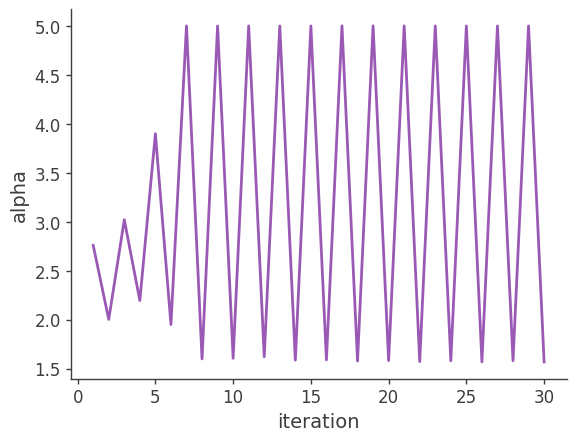

In [30]:
x, y = [], []

for _ in all_result:
    x.append(_['iteration'])
    y.append(_['alpha'])
    
plt.plot(x, y)
plt.xlabel("iteration")
plt.ylabel("alpha")

## find the location with the maximum flux
- as an example, here it calculate the location of the maximum flux at the 30th iteration's map at the highest energy bin 

In [31]:
import healpy as hp
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.coordinates import ICRS, Galactic, FK4, FK5

idx_iteration = 29
idx_energy = 4

argmax = np.argmax(all_result[idx_iteration]["model_map"].contents[:,idx_energy:idx_energy+1])
nside = all_result[idx_iteration]["model_map"].axes["lb"].nside
coordsys = all_result[idx_iteration]["model_map"].axes["lb"].coordsys

theta, phi = hp.pix2ang(nside, argmax)

l, b = phi * 180 / np.pi, 90 - theta * 180 / np.pi

c = SkyCoord(l, b, unit="deg", frame = coordsys)

print(f"The source position is around (l ,b) = ({c.galactic.l.deg} deg., {c.galactic.b.deg} deg.) in galactic")
print(f"The source position is around (ra, dec) = ({c.icrs.ra.deg} deg., {c.icrs.dec.deg} deg.) in icrs")

The source position is around (l ,b) = (50.62499999999999 deg., -19.47122063449069 deg.) in galactic
The source position is around (ra, dec) = (308.30194136772735 deg., 5.913074059175163 deg.) in icrs


## load the results from the save files

(<matplotlib.image.AxesImage at 0x2bb5013f0>, <Mollview: >)

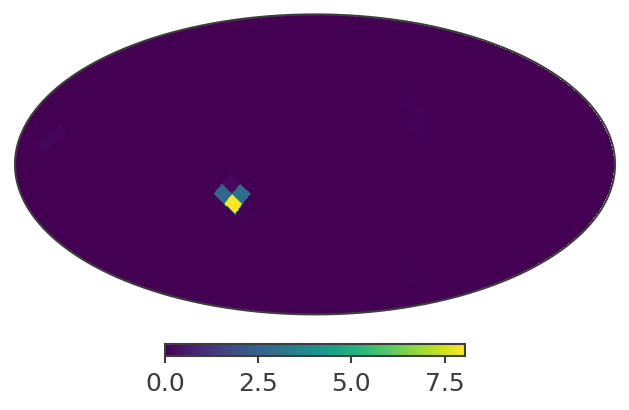

In [32]:
from histpy import Histogram
from mhealpy import HealpixMap


idx_iteration = 29
idx_energy = 4

model_map = Histogram.open(f"model_map_itr{idx_iteration}.hdf5")

map_energy_sliced = HealpixMap(data = model_map.slice[{"Ei": idx_energy}].contents.reshape([-1]))

map_energy_sliced.plot()